# Low resolution simulation analyses tas CRU

conda env: new `phd_v3` (in `envs/phd`)

Nudged simulations in wind at 6 hours and in temperature at 10 days, with released boundary layer. This configuration was chosen in order to compromise between not prescribing excessively the nudging close to the surface to let the ground-atmosphere coupling occur, while trying to minimize the biases of the model related to circulation and the tropospheric temperature bias observed.

Having a coupled simulation has the advantage of allowing snow-related feedbacks to emerge, while a forced ORCHIDEE simulation would largely prescribes snow. The coupling has of course advantages and disadvantages which are discussed in the article. More tests in forced version will of course be necessary with different forcing datasets to evaluate the uncertainty (however there is only a few data available over mountainous area and precipitation is often very uncertain).

Nudging is disabled in the "approximative" boundary layer (below 0.85 * surface pressure). It automatically adapts to the mountains (hybrid sigma-pressure levels; https://lmdz-forge.lmd.jussieu.fr/mediawiki/LMDZPedia/index.php/The_vertical_discretization_in_LMDZ), so for example if we are at 850 hPa at level 5 of the model when p_surf is 1000 hPa, we do not guide anywhere below level 5.

More information on nudging: 
- https://lmdz.lmd.jussieu.fr/le-coin-des-developpeurs/notes-techniques/ressources/guidage_LMDZ.pdf
- https://forge.ipsl.jussieu.fr/igcmg_doc/wiki/Doc/Models/LMDZ#Simulationwithnudging

More analyses of test simulations can be found here: https://github.com/mickaellalande/PhD/tree/master/Jean-Zay/SCA_parameterization/LMDZOR-STD

## Simulations 

- NY07: LMDZORnudge-uvt-6h-10d-noBL-STD-NY07-2004-2008
- R01: LMDZORnudge-uvt-6h-10d-noBL-STD-R01-2004-2008
- SL12: LMDZORnudge-uvt-6h-10d-noBL-STD-SL12-2004-2008
- LA22: LMDZORnudge-uvt-6h-10d-noBL-STD-LA22-2004-2008

## Path to simulations

- Jean-Zay WORK: `/gpfsdswork/projects/rech/goe/ufz23bm/SCA_parameterization/modipsl/config/LMDZOR_v6/`
- Jean-Zay STORE: `/gpfsstore/rech/goe/ufz23bm/IGCM_OUT/LMDZOR/DEVT/amip/`
- THREDDS: `/gpfsdsmnt/ipsl/dods/pub/ufz23bm/LMDZOR/DEVT/amip/`
- CICLAD: `/thredds/idris/work/ufz23bm/LMDZOR/DEVT/amip/` 
- local: `~/Dropbox/data/IGCM_OUT/LMDZOR/DEVT/amip/`
- https://vesg.ipsl.upmc.fr/thredds/catalog/idris_work/ufz23bm/LMDZOR/DEVT/amip/

## Import modules

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)
import calendar

import sys
sys.path.insert(1, '../utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
u.check_virtual_memory()

import warnings
warnings.filterwarnings("ignore")

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]
Virtual memory usage - total: 31 GB / available: 16 GB / percent used: 45.8 %


## Define paths

In [2]:
# root = '/thredds/idris/work/ufz23bm/LMDZOR/DEVT/amip/' # CICLAD
root = '/home/lalandmi/Dropbox/data/IGCM_OUT/LMDZOR/DEVT/amip/' # local

exp_NY07 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-NY07-2004-2008'
exp_R01 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-R01-2004-2008'
exp_SL12 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-SL12-2004-2008'
exp_LA22 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-LA22-2004-2008'

# 1 year spin-up
period = slice('2005', '2008')

## Load model data

In [3]:
tas_NY07 = xr.open_dataset(root+exp_NY07+'/ATM/Analyse/TS_MO/'+exp_NY07+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C
tas_R01 = xr.open_dataset(root+exp_R01+'/ATM/Analyse/TS_MO/'+exp_R01+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C
tas_SL12 = xr.open_dataset(root+exp_SL12+'/ATM/Analyse/TS_MO/'+exp_SL12+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C
tas_LA22 = xr.open_dataset(root+exp_LA22+'/ATM/Analyse/TS_MO/'+exp_LA22+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C

## Load observations

In [4]:
tas_CRU = xr.open_dataset('~/Dropbox/data/CRU/cru_ts4.00.1901.2015.tmp.dat.nc').tmp.sel(time=period)
tas_CRU['time'] = tas_NY07.time

## Regrid obs to model

In [5]:
regridder = xe.Regridder(tas_CRU, tas_NY07, 'bilinear', periodic=True, reuse_weights=True)
tas_CRU_regrid = regridder(tas_CRU)

tas_NY07 = tas_NY07.where(tas_CRU_regrid*0 == 0)
tas_R01 = tas_R01.where(tas_CRU_regrid*0 == 0)
tas_SL12 = tas_SL12.where(tas_CRU_regrid*0 == 0)
tas_LA22 = tas_LA22.where(tas_CRU_regrid*0 == 0)

Reuse existing file: bilinear_360x720_143x144_peri.nc


## Load topo

In [6]:
grid_LR = xr.open_dataset('/home/lalandmi/Dropbox/data/IGCM_OUT/ELI-144x142x79-GMTED-STD-amip_2004_grilles_gcm.nc')

topo_LR = u.phys2dyn(xr.open_dataset('/home/lalandmi/Dropbox/data/IGCM_OUT/ELI-144x142x79-GMTED-STD-amip_2004_startphy.nc').ZMEA_NOT_FILTERED, grid_LR)
std_LR = u.phys2dyn(xr.open_dataset('/home/lalandmi/Dropbox/data/IGCM_OUT/ELI-144x142x79-GMTED-STD-amip_2004_startphy.nc').ZSTD_NOT_FILTERED, grid_LR)

# To have same lon from -180 to 180
regridder = xe.Regridder(topo_LR, tas_NY07, 'bilinear', periodic=True, reuse_weights=True)
topo_LR_regrid = regridder(topo_LR)
std_LR_regrid = regridder(std_LR)

Reuse existing file: bilinear_143x144_143x144_peri.nc


## Plot

In [7]:
lat_slice_HMA, lon_slice_HMA = u.get_domain_HMA()

# Zones
latlim_SA = slice(-60, -10); lonlim_SA = slice(-80, -60)
latlim_US = slice(20, 70); lonlim_US = slice(-165, -85)
latlim_EU = slice(30, 80); lonlim_EU = slice(0, 20)
latlim_HMA = slice(20, 55); lonlim_HMA = slice(60, 116)

In [8]:
tas_CRU_regrid_seas = tas_CRU_regrid.groupby('time.season').mean('time')

params = ['NY07', 'R01', 'SL12', 'LA22']
for i, da in enumerate([tas_NY07, tas_R01, tas_SL12, tas_LA22]):
    da.name = params[i]
    if i == 0:
        ds_tas_params = da.groupby('time.season').mean('time').to_dataset()
    else:
        ds_tas_params[params[i]] = da.groupby('time.season').mean('time')

In [9]:
def compute_metrics(model, obs):
    mb = (model-obs).weighted(np.cos(np.deg2rad(model.lat))).mean().values.item(0)
    rmse = np.sqrt(((model-obs)**2).weighted(np.cos(np.deg2rad(model.lat))).mean().values.item(0))
    
    x = model.where(obs*0 == 0).values.flatten(); y = obs.where(model*0 == 0).values.flatten()
    x = x[~np.isnan(x)]; y = y[~np.isnan(y)]
    r = stats.pearsonr(x, y)
    
    return mb, rmse, r

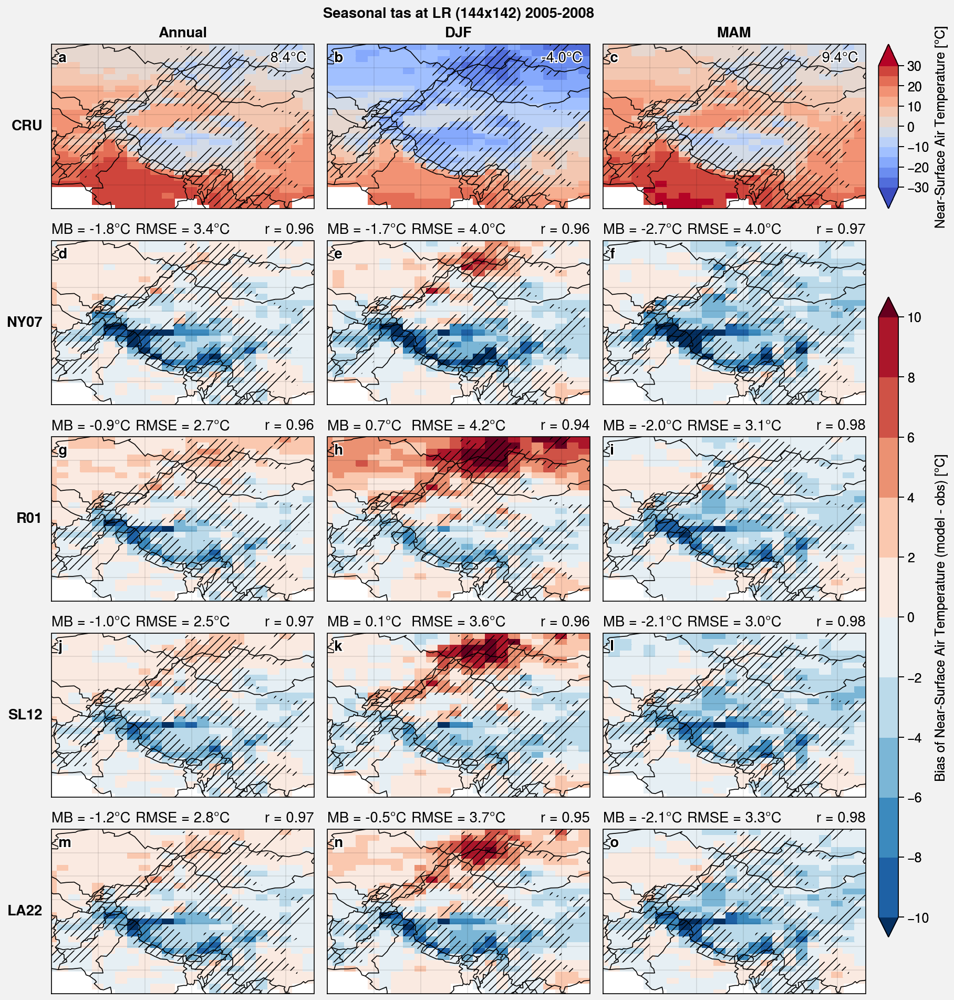

In [43]:
fig, axs = plot.subplots(ncols = 3, nrows = 5, proj='cyl', axwidth=2.5)

cmap = 'CoolWarm'
levels = plot.arange(-30, 30, 5)
extend = 'both'

cmap_bias = 'RdBu_r'
levels_bias = plot.arange(-10, 10, 2)
extend_bias = 'both'

threshold = 200 # STD

obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
m = axs[0].pcolormesh(tas_CRU_regrid_seas.mean('season'), cmap=cmap, levels=levels, extend=extend)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[0].format(urtitle='{:.1f}°C'.format(mean))

obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
axs[1].pcolormesh(obs, cmap=cmap, levels=levels, extend=extend)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[1].format(urtitle='{:.1f}°C'.format(mean))

obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
axs[2].pcolormesh(obs, cmap=cmap, levels=levels, extend=extend)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[2].format(urtitle='{:.1f}°C'.format(mean))

k = 3
for param in params:
    # Annual
    model = ds_tas_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
    obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
    m_bias = axs[k].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k].format(ltitle='MB = {:.1f}°C'.format(mb), ctitle='RMSE = {:.1f}°C'.format(rmse), rtitle='r = {:.2}'.format(r))
    
    # DJF
    model = ds_tas_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
    obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
    axs[k+1].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k+1].format(ltitle='MB = {:.1f}°C'.format(mb), ctitle='RMSE = {:.1f}°C'.format(rmse), rtitle='r = {:.2}'.format(r))
    
    # MAM
    model = ds_tas_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
    obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
    axs[k+2].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k+2].format(ltitle='MB = {:.1f}°C'.format(mb), ctitle='RMSE = {:.1f}°C'.format(rmse), rtitle='r = {:.2}'.format(r))
    
    k += 3
    
for ax in axs:
#     ax.contour(std_LR_regrid, levels=[200], color='red')
    ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

fig.colorbar(m, label='Near-Surface Air Temperature [°C]', row=1)
fig.colorbar(m_bias, label='Bias of Near-Surface Air Temperature (model - obs) [°C]', rows=(2,5), length=0.85)

axs.format(
    latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop),
    collabels = ['Annual', 'DJF', 'MAM'],
    rowlabels = ['CRU'] + params,
    borders=True, coast=True, labels=False, 
    abc=True, abcloc='ul',
    suptitle='Seasonal tas at LR (144x142) '+str(period.start)+'-'+str(period.stop) 
)

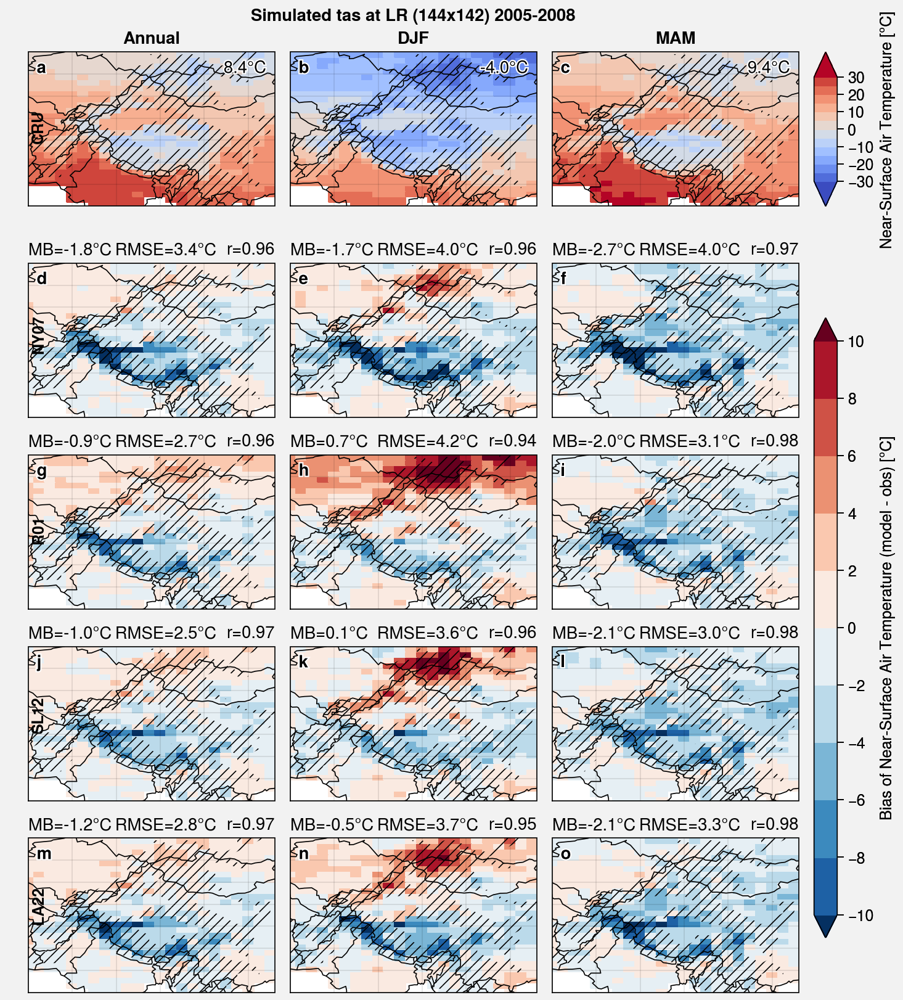

In [18]:
fig, axs = plot.subplots(ncols=3, nrows=5, proj='cyl', axwidth=2)

cmap = 'CoolWarm'
levels = plot.arange(-30, 30, 5)
extend = 'both'

cmap_bias = 'RdBu_r'
levels_bias = plot.arange(-10, 10, 2)
extend_bias = 'both'

threshold = 200 # STD

obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
m = axs[0].pcolormesh(tas_CRU_regrid_seas.mean('season'), cmap=cmap, levels=levels, extend=extend)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[0].format(urtitle='{:.1f}°C'.format(mean))

obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
axs[1].pcolormesh(obs, cmap=cmap, levels=levels, extend=extend)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[1].format(urtitle='{:.1f}°C'.format(mean))

obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
axs[2].pcolormesh(obs, cmap=cmap, levels=levels, extend=extend)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[2].format(urtitle='{:.1f}°C'.format(mean))

k = 3
for param in params:
    # Annual
    model = ds_tas_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
    obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
    m_bias = axs[k].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k].format(ltitle='MB={:.1f}°C'.format(mb), ctitle='      RMSE={:.1f}°C'.format(rmse), rtitle='r={:.2}'.format(r))
    
    # DJF
    model = ds_tas_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
    obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
    axs[k+1].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k+1].format(ltitle='MB={:.1f}°C'.format(mb), ctitle='      RMSE={:.1f}°C'.format(rmse), rtitle='r={:.2}'.format(r))
    
    # MAM
    model = ds_tas_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
    obs = tas_CRU_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
    axs[k+2].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k+2].format(ltitle='MB={:.1f}°C'.format(mb), ctitle='      RMSE={:.1f}°C'.format(rmse), rtitle='r={:.2}'.format(r))
    
    k += 3
    
for ax in axs:
#     ax.contour(std_LR_regrid, levels=[200], color='red')
    ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

# axs[1].colorbar(m, label='Snow Cover Fraction [%]', loc='b', ticks=20)
# fig.colorbar(m_bias, label='Bias of Snow Cover Fraction (model - obs) [%]', cols=(1, 3), length=0.6, loc='b', ticks=10)

fig.colorbar(m, label='Near-Surface Air Temperature [°C]', row=1)
fig.colorbar(m_bias, label='Bias of Near-Surface Air Temperature (model - obs) [°C]', rows=(2,5), length=0.85)


for pos, label in zip(np.append(np.linspace(0.08, 0.65, 4), 0.86), params[::-1] + ['CRU']):
    fig.text(0.035, pos, label, fontweight='bold', rotation='vertical')

axs.format(
    latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop),
    collabels = ['Annual', 'DJF', 'MAM'],
#     rowlabels = ['SnowCCI\n(MODIS)'] + params,
    borders=True, coast=True, labels=False, 
    abc=True, abcloc='ul',
    suptitle='Simulated tas at LR (144x142) '+str(period.start)+'-'+str(period.stop) 
)

fig.save('img/fig_simu_tas_spatial_bias_LR_DJF_MAM_v0.jpg')

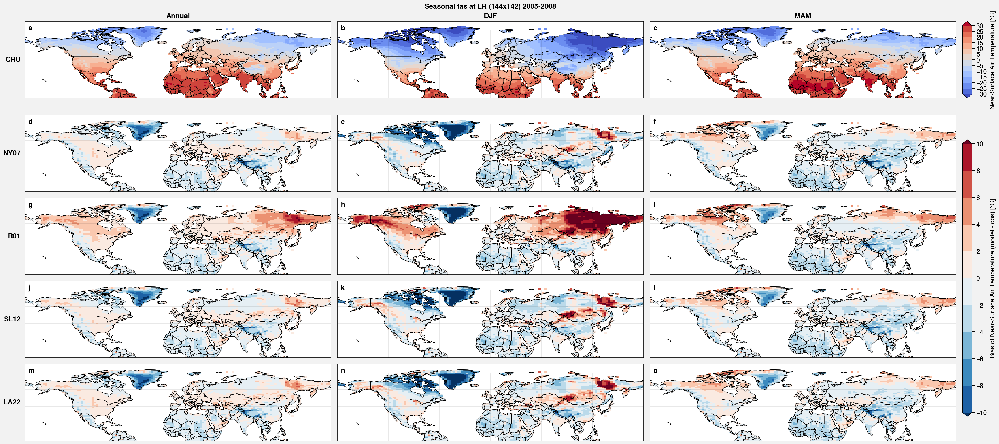

In [53]:
fig, axs = plot.subplots(ncols = 3, nrows = 5, proj='cyl', axwidth=6)

cmap = 'CoolWarm'
levels = plot.arange(-30, 30, 5)
extend = 'both'

cmap_bias = 'RdBu_r'
levels_bias = plot.arange(-10, 10, 2)
extend_bias = 'both'

m = axs[0].pcolormesh(tas_CRU_regrid_seas.mean('season'), cmap=cmap, levels=levels, extend=extend)
axs[1].pcolormesh(tas_CRU_regrid_seas.sel(season='DJF'), cmap=cmap, levels=levels, extend=extend)
axs[2].pcolormesh(tas_CRU_regrid_seas.sel(season='MAM'), cmap=cmap, levels=levels, extend=extend)

k = 3
for param in params:
    m_bias = axs[k].pcolormesh(ds_tas_params[param].mean('season') - tas_CRU_regrid_seas.mean('season'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    axs[k+1].pcolormesh(ds_tas_params[param].sel(season='DJF') - tas_CRU_regrid_seas.sel(season='DJF'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    axs[k+2].pcolormesh(ds_tas_params[param].sel(season='MAM') - tas_CRU_regrid_seas.sel(season='MAM'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
#     axs[k+1].pcolormesh(ds_tas_params[param].sel(season='JJA') - tas_CRU_regrid_seas.sel(season='JJA'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
#     axs[k+2].pcolormesh(ds_tas_params[param].sel(season='SON') - tas_CRU_regrid_seas.sel(season='SON'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    k += 3

fig.colorbar(m, label='Near-Surface Air Temperature [°C]', row=1)
fig.colorbar(m_bias, label='Bias of Near-Surface Air Temperature (model - obs) [°C]', rows=(2,5), length=0.85)

axs.format(
    latlim=(0, 90),
    collabels = ['Annual', 'DJF', 'MAM'],
    rowlabels = ['CRU'] + params,
    borders=True, coast=True, labels=False, 
    abc=True, abcloc='ul',
    suptitle='Seasonal tas at LR (144x142) '+str(period.start)+'-'+str(period.stop) 
)

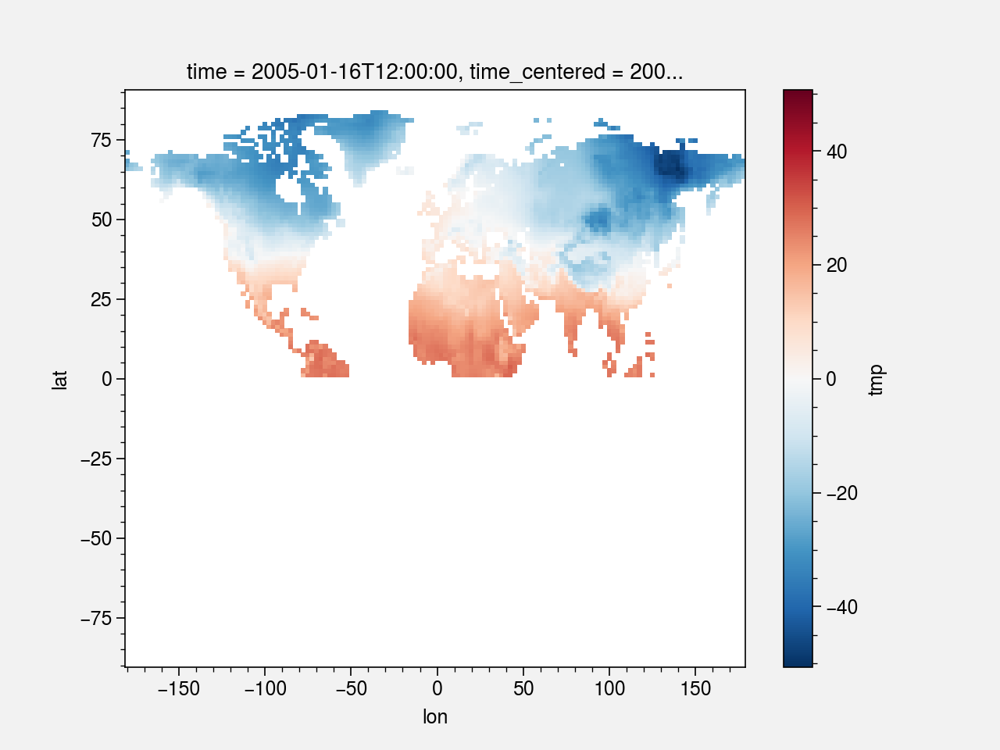

In [54]:
tas_CRU_regrid.where(tas_CRU_regrid.lat > 0)[0].plot()

In [55]:
ts_CRU_NH_mountain = u.spatial_average(tas_CRU_regrid.groupby('time.month').mean().where(tas_CRU_regrid.lat > 0).where(std_LR_regrid > 200))

params = ['NY07', 'R01', 'SL12', 'LA22']
for i, da in enumerate([tas_NY07, tas_R01, tas_SL12, tas_LA22]):
    ts = u.spatial_average(da.where(tas_CRU_regrid*0 == 0).groupby('time.month').mean().where(da.lat > 0).where(std_LR_regrid > 200))
    ts.name = params[i]
    
    rmse = np.sqrt(u.spatial_average((tas_CRU_regrid.groupby('time.month').mean().where(tas_CRU_regrid.lat > 0).where(std_LR_regrid > 200) - \
            da.where(tas_CRU_regrid*0 == 0).groupby('time.month').mean().where(da.lat > 0).where(std_LR_regrid > 200))**2))
    rmse.name = params[i]
    
    if i == 0:
        ds_NH_mountain = ts.to_dataset()
        ds_NH_mountain_rmse = rmse.to_dataset()
    
    ds_NH_mountain[params[i]] = ts
    ds_NH_mountain_rmse[params[i]] = rmse

In [56]:
ts_CRU_NH_flat = u.spatial_average(tas_CRU_regrid.groupby('time.month').mean().where(tas_CRU_regrid.lat > 0).where(std_LR_regrid < 200))

params = ['NY07', 'R01', 'SL12', 'LA22']
for i, da in enumerate([tas_NY07, tas_R01, tas_SL12, tas_LA22]):
    ts = u.spatial_average(da.where(tas_CRU_regrid*0 == 0).groupby('time.month').mean().where(da.lat > 0).where(std_LR_regrid < 200))
    ts.name = params[i]
    
    rmse = np.sqrt(u.spatial_average((tas_CRU_regrid.groupby('time.month').mean().where(tas_CRU_regrid.lat > 0).where(std_LR_regrid < 200) - \
            da.where(tas_CRU_regrid*0 == 0).groupby('time.month').mean().where(da.lat > 0).where(std_LR_regrid < 200))**2))
    rmse.name = params[i]
    
    if i == 0:
        ds_NH_flat = ts.to_dataset()
        ds_NH_flat_rmse = rmse.to_dataset()
    
    ds_NH_flat[params[i]] = ts
    ds_NH_flat_rmse[params[i]] = rmse

In [57]:
params = ['NY07', 'R01', 'SL12', 'LA22']
zones = ['US', 'EU', 'SA', 'HMA']
ds_list_CRU = [None]*len(zones)
ds_list = [None]*len(zones)
ds_list_rmse = [None]*len(zones)
for i, da in enumerate([tas_NY07, tas_R01, tas_SL12, tas_LA22]):
    
    for i_zone, (latlim, lonlim) in enumerate(zip([latlim_US, latlim_EU, latlim_SA, latlim_HMA], [lonlim_US, lonlim_EU, lonlim_SA, lonlim_HMA])):
        ds_list_CRU[i_zone] = u.spatial_average(tas_CRU_regrid.groupby('time.month').mean().where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))
        
        ts = u.spatial_average(da.where(tas_CRU_regrid*0 == 0).groupby('time.month').mean().where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))
        ts.name = params[i]

        rmse = np.sqrt(u.spatial_average((tas_CRU_regrid.groupby('time.month').mean().where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim) - \
                da.where(tas_CRU_regrid*0 == 0).groupby('time.month').mean().where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))**2))
        rmse.name = params[i]

        if i == 0:
            ds_list[i_zone] = ts.to_dataset()
            ds_list_rmse[i_zone] = rmse.to_dataset()

        ds_list[i_zone][params[i]] = ts
        ds_list_rmse[i_zone][params[i]] = rmse

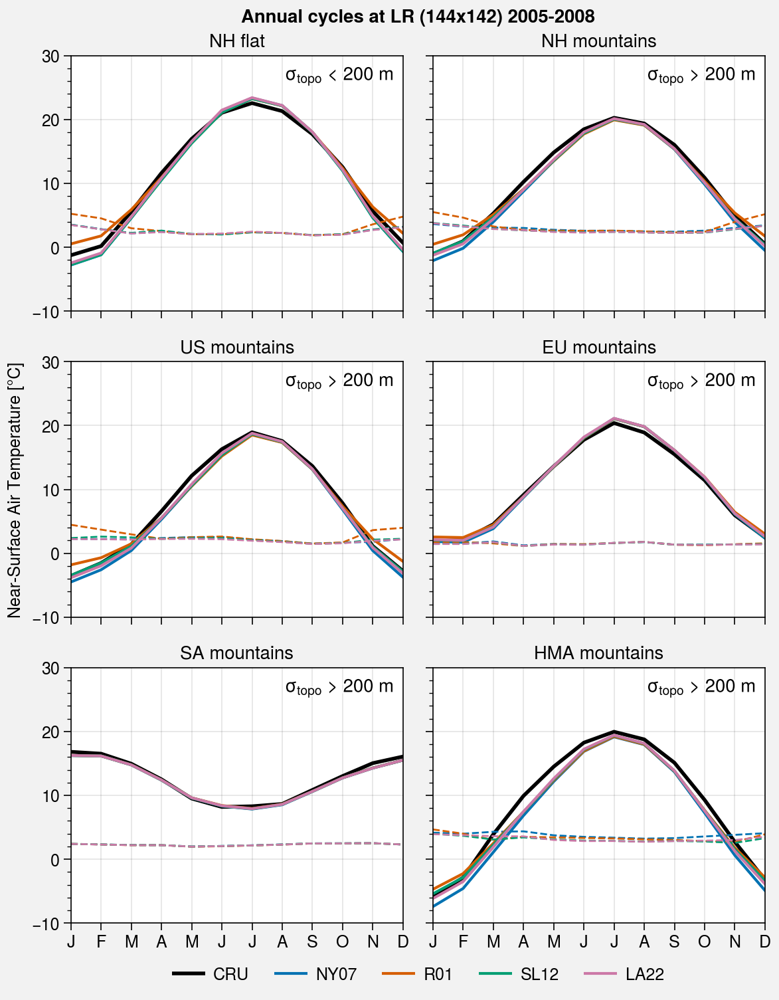

In [58]:
zones = ['US', 'EU', 'SA', 'HMA']

fig, axs = plot.subplots(ncols = 2, nrows = 3, aspect=1.3)
roll = 0
ylim = (-10, 30)

# Flat NH
axs[0].plot(ts_CRU_NH_flat.roll(month=roll).values, color='k', label='CRU', lw=2)
for i, param in enumerate(params):
    axs[0].plot(ds_NH_flat[param].roll(month=roll).values, label=param, color='C'+str(i))
    axs[0].plot(ds_NH_flat_rmse[param].roll(month=roll).values, ls='--', color='C'+str(i), lw=1)
    
axs[0].format(title='NH flat', urtitle='$\sigma_{topo}$ < 200 m')

# Mountain NH
axs[1].plot(ts_CRU_NH_mountain.roll(month=roll).values, color='k', lw=2)
for i, param in enumerate(params):
    axs[1].plot(ds_NH_mountain[param].roll(month=roll).values, color='C'+str(i))
    axs[1].plot(ds_NH_mountain_rmse[param].roll(month=roll).values, ls='--', color='C'+str(i), lw=1)
    
axs[1].format(title='NH mountains', urtitle='$\sigma_{topo}$ > 200 m')

# Mountain zones
for i, zone in enumerate(zones):
    axs[i+2].plot(ds_list_CRU[i].roll(month=roll).values, color='k', lw=2)
    for i_param, param in enumerate(params):
        axs[i+2].plot(ds_list[i][param].roll(month=roll).values, color='C'+str(i_param))
        axs[i+2].plot(ds_list_rmse[i][param].roll(month=roll).values, ls='--', color='C'+str(i_param), lw=1)

    axs[i+2].format(title=zone+' mountains', urtitle='$\sigma_{topo}$ > 200 m')
    
for ax in axs:
    ax.autoscale(tight=True)
    
axs.format(
    xlocator='index', xformatter=[calendar.month_abbr[i][0] for i in ds_NH_mountain[param].roll(month=roll).month.values], xtickminor=False,
    ylabel='Near-Surface Air Temperature [°C]', ylim=ylim,
    suptitle='Annual cycles at LR (144x142) '+str(period.start)+'-'+str(period.stop)
)

fig.legend(loc='b', frame=False, ncols=6, order='F', center=False)

### Taylor diagram sur TS

In [59]:
column_indexes = [['LR', 'HR'], ['CRU', 'NY07', 'R01', 'SL12', 'LA22']]
columns = pd.MultiIndex.from_product(column_indexes)

zones = ['NH_flat', 'NH_mount', 'US_mount', 'EU_mount', 'SA_mount', 'HMA_mount']
row_indexes = [zones, ['mb', 'rmse', 'r', 'std']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=columns)
df_metrics

LR                       HR                    
                CRU NY07  R01 SL12 LA22  CRU NY07  R01 SL12 LA22
NH_flat   mb    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          rmse  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          r     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          std   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
NH_mount  mb    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          rmse  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          r     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          std   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
US_mount  mb    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          rmse  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          r     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          std   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
EU_mount  mb    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          rmse  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          r     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          std   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
SA_mount  mb    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          rmse  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          r     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          std   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
HMA_mount mb    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          rmse  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          r     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
          std   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

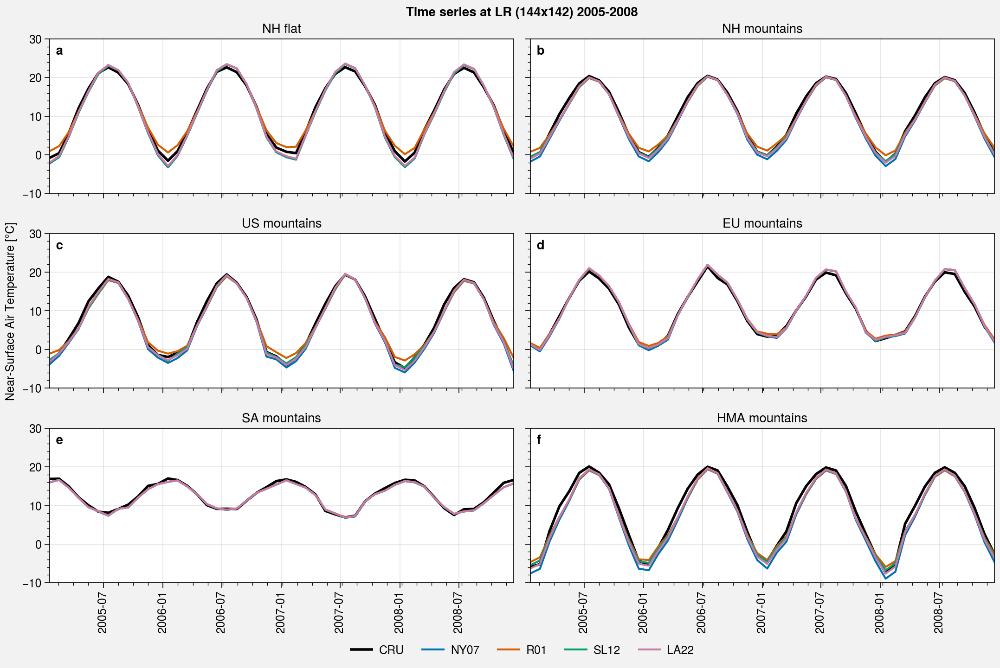

In [60]:
zones = ['NH_flat', 'NH_mount', 'US_mount', 'EU_mount', 'SA_mount', 'HMA_mount']
titles = ['NH flat', 'NH mountains', 'US mountains', 'EU mountains', 'SA mountains', 'HMA mountains']
latlim_zones = [slice(0, 90), slice(0, 90), latlim_US, latlim_EU, latlim_SA, latlim_HMA]
lonlim_zones = [slice(None), slice(None), lonlim_US, lonlim_EU, lonlim_SA, lonlim_HMA]

fig, axs = plot.subplots(nrows=3, ncols=2, axwidth=5, aspect=3)

list_tas = [tas_CRU_regrid, tas_NY07, tas_R01, tas_SL12, tas_LA22]
labels = ['CRU', 'NY07', 'R01', 'SL12', 'LA22']

for i, (zone, latlim, lonlim) in enumerate(zip(zones, latlim_zones, lonlim_zones)):
    
    if i == 0:
        cond_std = (std_LR_regrid < 200)
    else:
        cond_std = (std_LR_regrid > 200)
            
    ts_ref = u.spatial_average(tas_CRU_regrid.where(cond_std).sel(lat=latlim, lon=lonlim))
    
    for j, da in enumerate(list_tas):
        ts = u.spatial_average(da.where(cond_std).sel(lat=latlim, lon=lonlim))
        if i == 0:
            if j == 0:
                axs[i].plot(ts, label=labels[j], color='k', lw=2)
            else:
                axs[i].plot(ts, label=labels[j])
        else:
            if j == 0:
                axs[i].plot(ts, color='k', lw=2)
            else:
                axs[i].plot(ts)
            
        # Compute metrics
        mb = (ts - ts_ref).mean().values.item(0)
        rmse = np.sqrt( ( (ts - ts_ref)**2 ).mean().values.item(0) )
        r = stats.pearsonr(ts, ts_ref)[0]
        std = ts.std().values.item(0)

        df_metrics.loc[(zone), ('LR', labels[j])]  = [mb, rmse, r, std]
            

for i, ax in enumerate(axs):
    ax.autoscale(tight=True)
    ax.format(title=titles[i])

axs.format(
#     collabels=['not optimized', '', 'optimized', ''],
#     rowlabels=zones,
    abc=True, abcloc='ul',
    ylim=(-10, 30), ylabel='Near-Surface Air Temperature [°C]', xlabel='',
    suptitle='Time series at LR (144x142) '+str(period.start)+'-'+str(period.stop)
)

fig.legend(loc='b', frame=False, ncols=6, order='F', center=False)

# fig.save('img/timeseries_ac_1deg.jpg')

In [50]:
df_metrics

LR                                           HR       \
                    CRU      NY07       R01      SL12      LA22  CRU NY07   
NH_flat   mb          0 -0.378414  0.146538 -0.428239 -0.268776  NaN  NaN   
          rmse        0  0.823512   0.71452  0.868899  0.724023  NaN  NaN   
          r           1  0.997925  0.995238  0.997391  0.997886  NaN  NaN   
          std   7.14173   7.69571   7.04096   7.67606   7.61305  NaN  NaN   
NH_mount  mb          0 -0.956635 -0.366468 -0.564276 -0.644602  NaN  NaN   
          rmse        0   1.07535  0.783533  0.760762   0.78326  NaN  NaN   
          r           1  0.998206  0.995876   0.99718  0.997878  NaN  NaN   
          std   6.74068   7.00855   6.38792   6.65484   6.79952  NaN  NaN   
US_mount  mb          0  -1.10277 -0.654259 -0.819539 -0.879868  NaN  NaN   
          rmse        0   1.22663  0.899065  0.960045  0.998732  NaN  NaN   
          r           1  0.998485  0.996159  0.997528  0.998316  NaN  NaN   
          std   6.93897    7.3063   6.80682   7.03257    7.1749  NaN  NaN   
EU_mount  mb          0  0.222037  0.375027  0.303611  0.328937  NaN  NaN   
          rmse        0   0.61915   0.59346  0.586661  0.602691  NaN  NaN   
          r           1  0.998775  0.998616  0.998834  0.998796  NaN  NaN   
          std   6.72586   7.19015   7.01056   7.10085   7.10012  NaN  NaN   
SA_mount  mb          0 -0.286083 -0.253665 -0.279128 -0.267978  NaN  NaN   
          rmse        0  0.452902   0.44469  0.452873   0.44949  NaN  NaN   
          r           1  0.995101    0.9951  0.995178   0.99509  NaN  NaN   
          std   3.24295   3.08393   3.05218   3.06606   3.06207  NaN  NaN   
HMA_mount mb          0  -1.81004  -0.88449  -1.03924  -1.21015  NaN  NaN   
          rmse        0   1.94611   1.40558   1.36122   1.39575  NaN  NaN   
          r           1  0.997234  0.994738  0.995753  0.996959  NaN  NaN   
          std   8.88906   9.13769   8.23899   8.53017    8.8004  NaN  NaN   

                               
                R01 SL12 LA22  
NH_flat   mb    NaN  NaN  NaN  
          rmse  NaN  NaN  NaN  
          r     NaN  NaN  NaN  
          std   NaN  NaN  NaN  
NH_mount  mb    NaN  NaN  NaN  
          rmse  NaN  NaN  NaN  
          r     NaN  NaN  NaN  
          std   NaN  NaN  NaN  
US_mount  mb    NaN  NaN  NaN  
          rmse  NaN  NaN  NaN  
          r     NaN  NaN  NaN  
          std   NaN  NaN  NaN  
EU_mount  mb    NaN  NaN  NaN  
          rmse  NaN  NaN  NaN  
          r     NaN  NaN  NaN  
          std   NaN  NaN  NaN  
SA_mount  mb    NaN  NaN  NaN  
          rmse  NaN  NaN  NaN  
          r     NaN  NaN  NaN  
          std   NaN  NaN  NaN  
HMA_mount mb    NaN  NaN  NaN  
          rmse  NaN  NaN  NaN  
          r     NaN  NaN  NaN  
          std   NaN  NaN  NaN

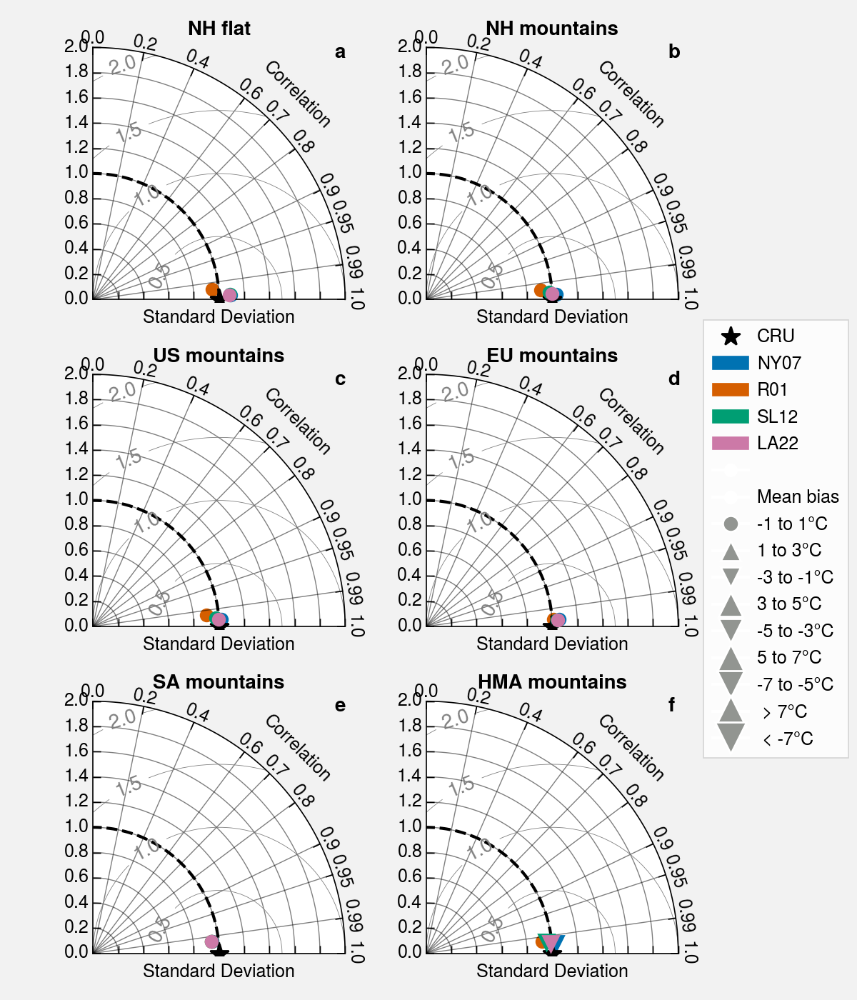

In [62]:
import string 

abc = list(string.ascii_lowercase)
srange = [(0, 1.7), (0, 4.4)]

labels = ['NY07', 'R01', 'SL12', 'LA22']
titles = ['NH flat', 'NH mountains', 'US mountains', 'EU mountains', 'SA mountains', 'HMA mountains']
colors = ['C0', 'C1', 'C2', 'C3']

fig = plt.figure(figsize=(6,7))

k = 1

for i_zone, zone in enumerate(zones):
    std_ref = df_metrics['LR', 'CRU'].loc[zone, 'std']
    dia = u.TaylorDiagram(1, fig=fig, rect='32'+str(k), label='CRU', srange=(0, 2), extend=False)

    for i, label in enumerate(labels):
        bias = df_metrics['LR', label].loc[zone, 'mb']
        if bias > 1:
            marker = '^'
        elif bias < -1:
            marker = 'v'
        else:
            marker = 'o'

        if np.abs(bias) < 1:
            markersize = 6
        elif np.abs(bias) < 3:
            markersize = 8
        elif np.abs(bias) < 5:
            markersize = 10
        elif np.abs(bias) < 7:
            markersize = 12
        else:
            markersize = 14

        dia.add_sample(
            df_metrics['LR', label].loc[zone, 'std']/std_ref, 
            df_metrics['LR', label].loc[zone, 'r'], 
            marker=marker, markersize=markersize,
            ms=10, ls='', mfc=colors[i], mec=colors[i], label=label, zorder=i
        )

        dia._ax.set_title(titles[i_zone], fontweight="bold")

    dia._ax.text(0.95, 0.95, abc[k-1], size=10, weight='bold', transform=dia._ax.transAxes)
    dia._ax.axis["left"].toggle(ticklabels=False)

    # Add RMS contours, and label them + grid
    contours = dia.add_contours(levels=4, colors='0.5', linewidths=0.3)  # 5 levels in grey
    plt.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    dia._ax.grid(lw=0.5, alpha=0.5)

    k += 1

from matplotlib.patches import Patch
from matplotlib.lines import Line2D
legend_handles = [dia.samplePoints[0]]
for color, label in zip(colors, labels):     
    legend_handles.append(Patch(facecolor=color, edgecolor=color, label=label))
    
# Bias
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='', markerfacecolor='w', markersize=6))
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='Mean bias', markerfacecolor='w', markersize=6))
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='-1 to 1°C', markerfacecolor='gray', markersize=6+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label='1 to 3°C', markerfacecolor='gray', markersize=8+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-3 to -1°C', markerfacecolor='gray', markersize=8+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label='3 to 5°C', markerfacecolor='gray', markersize=10+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-5 to -3°C', markerfacecolor='gray', markersize=10+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label='5 to 7°C', markerfacecolor='gray', markersize=12+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-7 to -5°C', markerfacecolor='gray', markersize=12+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label=' > 7°C', markerfacecolor='gray', markersize=14+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label=' < -7°C', markerfacecolor='gray', markersize=14+2))
    
fig.legend(handles=legend_handles, ncol=1, bbox_to_anchor=(0.99, 0.68))        
fig.tight_layout(rect=[0.05, 0, 0.85, 1])
# fig.savefig('img/taylor_diagrams_validation.jpg', dpi=300)

### Spatial plots

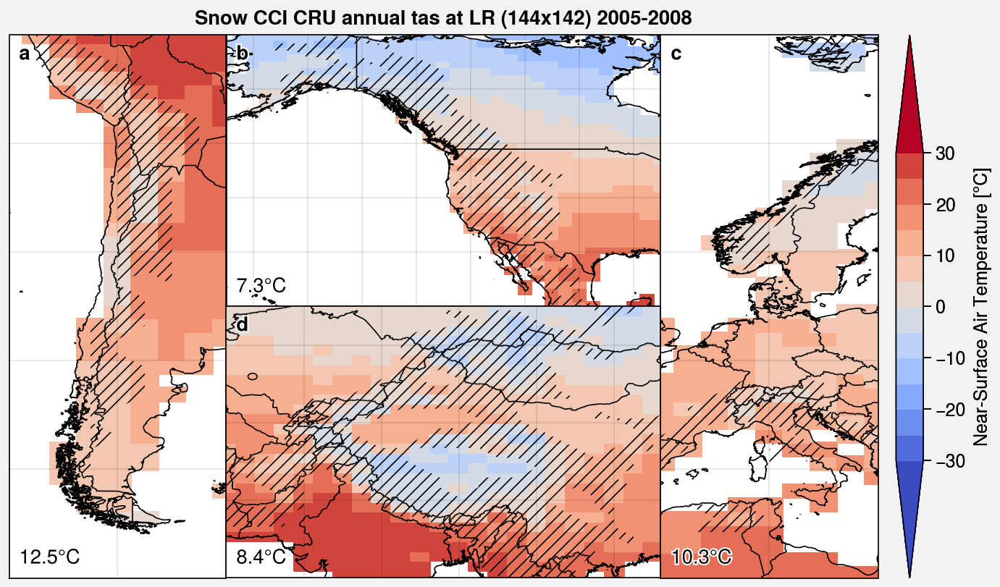

In [67]:
fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

da = tas_CRU_regrid_seas.mean('season')
cmap = 'CoolWarm'
levels = plot.arange(-30, 30, 5)
extend = 'both'

threshold = 200 # STD

for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
    obs = da.sel(lat=latlim, lon=lonlim)
    m = axs[i].pcolormesh(obs, cmap=cmap, levels=levels, extend=extend)
    mean = (u.spatial_average(obs.where(std_LR_regrid > threshold))).values.item(0)
    axs[i].format(
        latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
        lltitle='{:.1f}°C'.format(mean)
    )


fig.colorbar(m, label='Near-Surface Air Temperature [°C]', ticks=10)

for ax in axs:
    ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

axs.format(
    lonlines=10, latlines=10,
    suptitle='CRU annual tas at LR (144x142) '+str(period.start)+'-'+str(period.stop),
    coast=True, borders=True,
#     ocean=True, oceancolor='pale blue',
    abc=True, abcloc='ul', reso='hi'
)

# fig.save('img/snowCCI_CRU_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

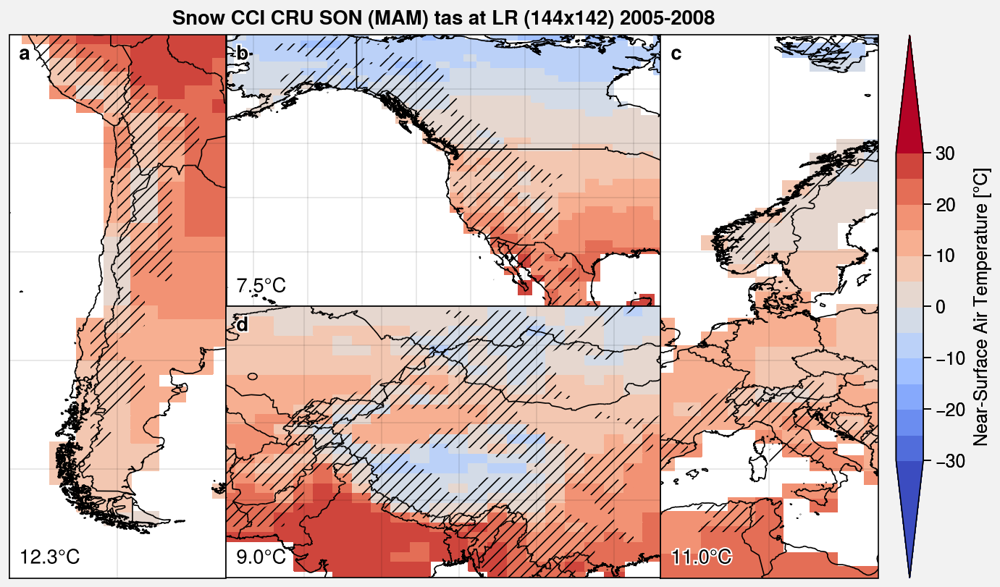

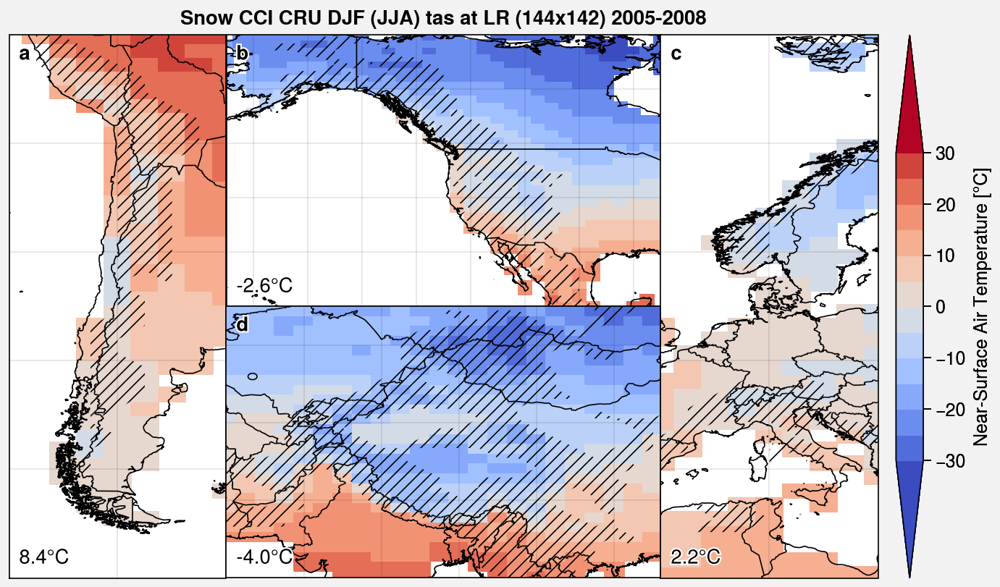

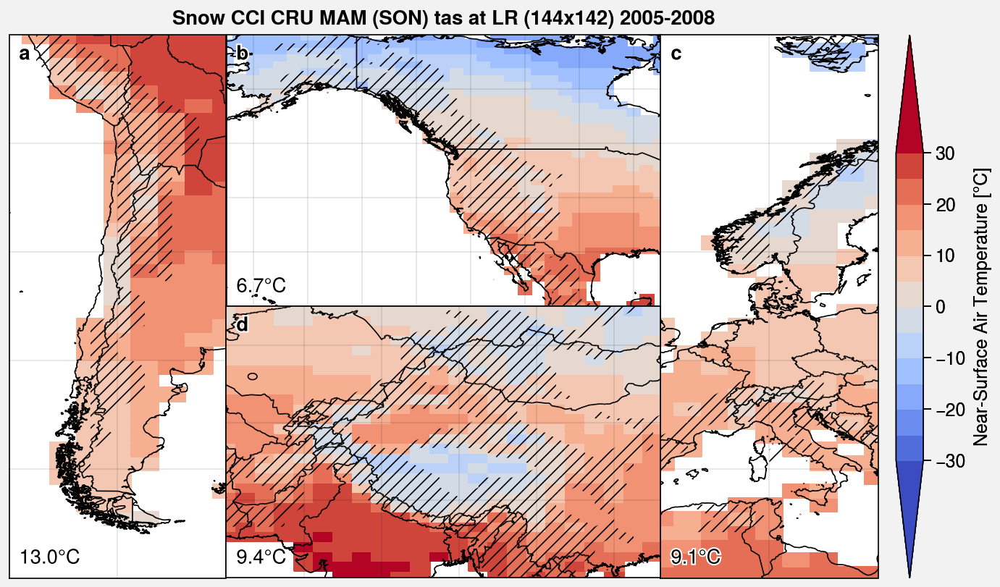

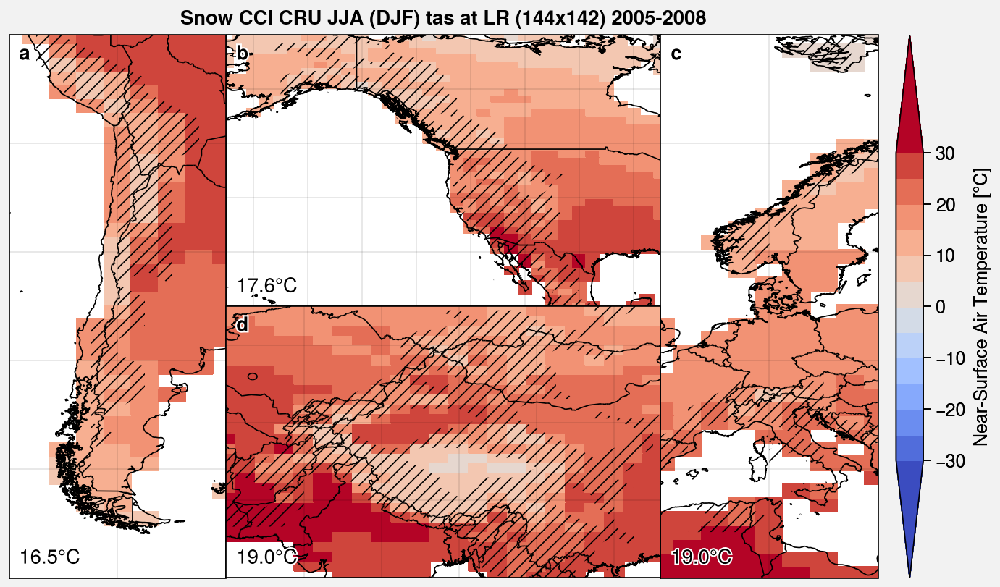

In [68]:
seasons = ['SON', 'DJF', 'MAM', 'JJA']
seasons_SA = ['MAM', 'JJA', 'SON', 'DJF']

cmap = 'CoolWarm'
levels = plot.arange(-30, 30, 5)
extend = 'both'

threshold = 200 # STD

for i_season, season in enumerate(seasons):
    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)
    
    # Take winter for NH and SH
    da = tas_CRU_regrid_seas.sel(season=season)
    da_SA = tas_CRU_regrid_seas.sel(season=seasons_SA[i_season])

    for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
        if i == 0: # take oposite season for SH
            obs = da_SA.sel(lat=latlim, lon=lonlim)
        else:
            obs = da.sel(lat=latlim, lon=lonlim)
            
        m = axs[i].pcolormesh(obs, cmap=cmap, levels=levels, extend=extend)
        mean = (u.spatial_average(obs.where(std_LR_regrid > threshold))).values.item(0)
        axs[i].format(
            latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
            lltitle='{:.1f}°C'.format(mean)
        )


    fig.colorbar(m, label='Near-Surface Air Temperature [°C]', ticks=10)

    for ax in axs:
        ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='CRU '+season+' ('+seasons_SA[i_season]+') tas at LR (144x142) '+str(period.start)+'-'+str(period.stop),
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )

    # fig.save('img/snowCCI_CRU_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

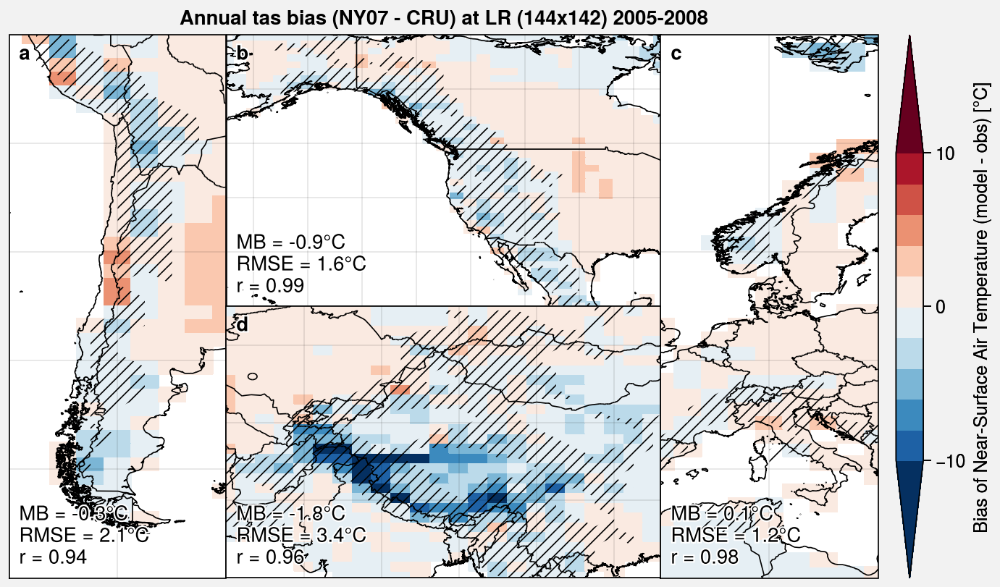

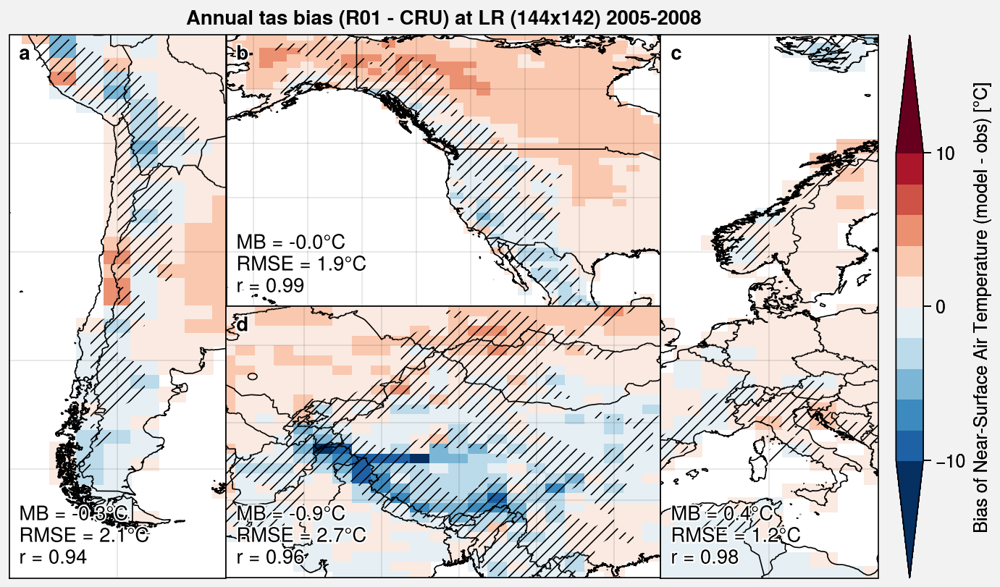

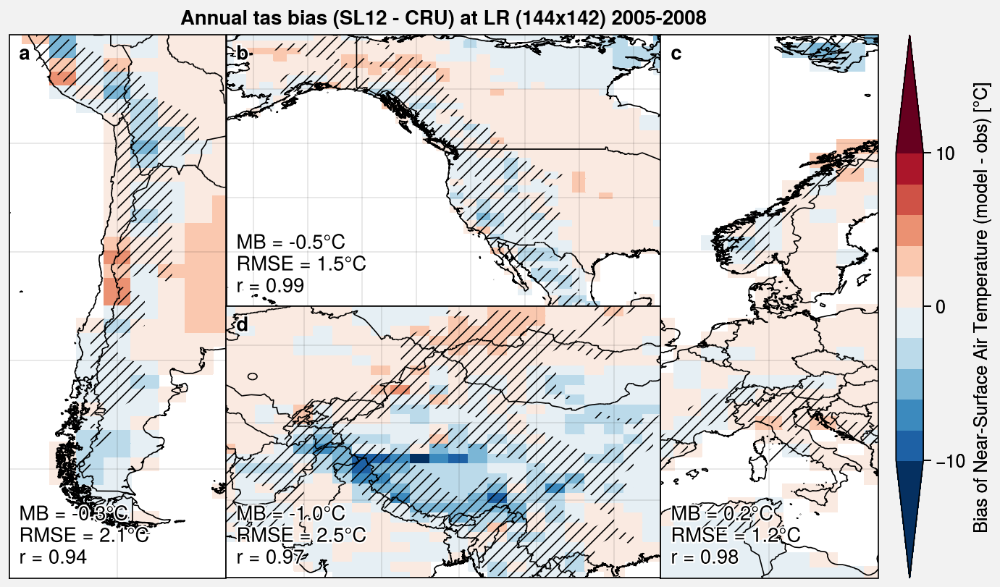

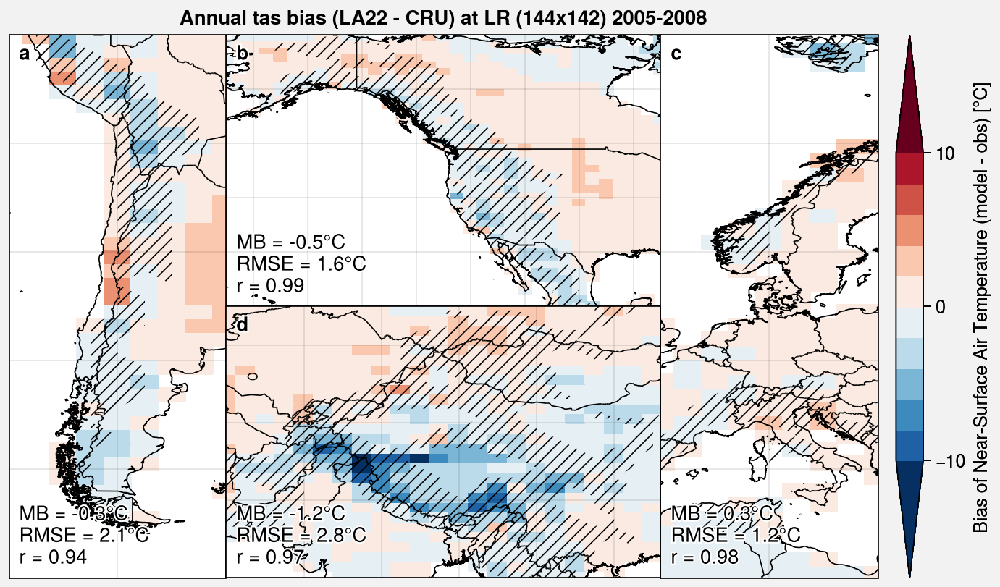

In [69]:
params = ['NY07', 'R01', 'SL12', 'LA22']
for param in params:

    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

    obs = tas_CRU_regrid_seas.mean('season')
    model = ds_tas_params[param].mean('season')

    cmap = 'RdBu_r'
    levels = plot.arange(-10, 10, 2)
    extend = 'both'

    threshold = 200 # STD

    for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
        obs_subset = obs.sel(lat=latlim, lon=lonlim)
        model_subset = model.sel(lat=latlim, lon=lonlim)

        m = axs[i].pcolormesh(model_subset - obs_subset, cmap=cmap, levels=levels, extend=extend)
        mb, rmse, (r, _) = compute_metrics(model_subset.where(std_LR_regrid > threshold), obs_subset.where(std_LR_regrid > threshold))
        axs[i].format(
            latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
            lltitle='MB = {:.1f}°C'.format(mb)+'\nRMSE = {:.1f}°C'.format(rmse)+'\nr = {:.2}'.format(r)
        )


    fig.colorbar(m, label='Bias of Near-Surface Air Temperature (model - obs) [°C]', ticks=10)

    for ax in axs:
        ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='Annual tas bias ('+param+' - CRU) at LR (144x142) '+str(period.start)+'-'+str(period.stop),
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )

    # fig.save('img/snowCCI_CRU_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

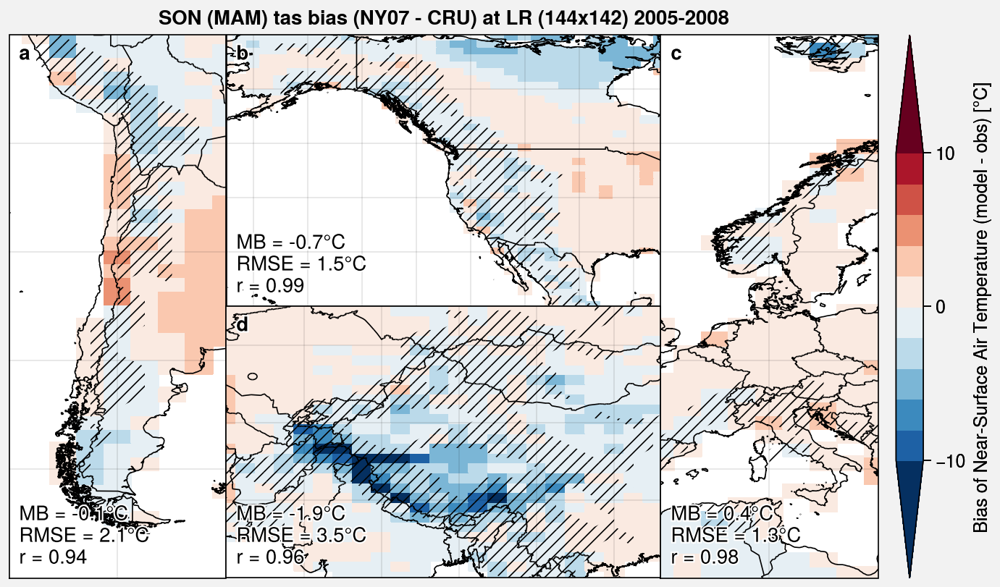

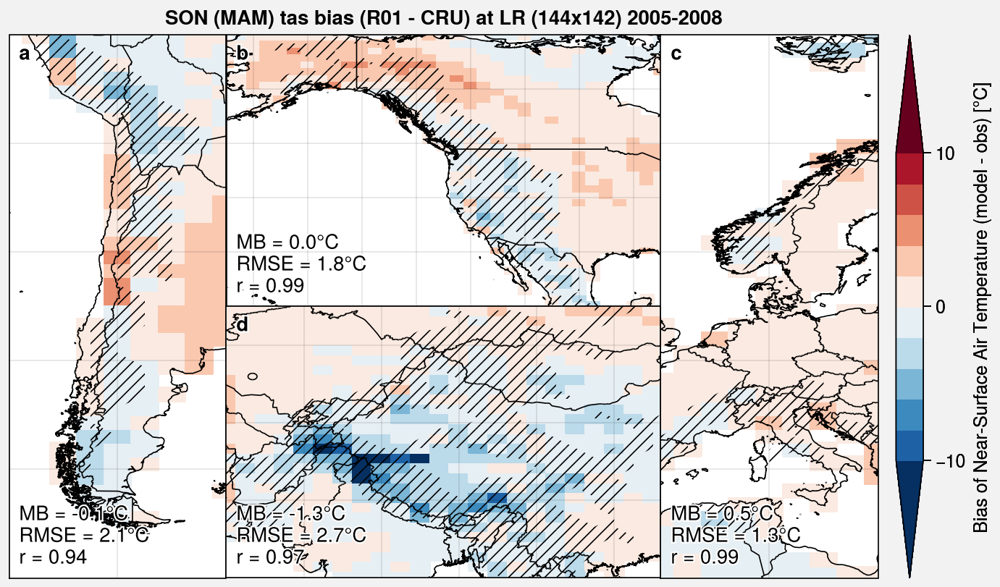

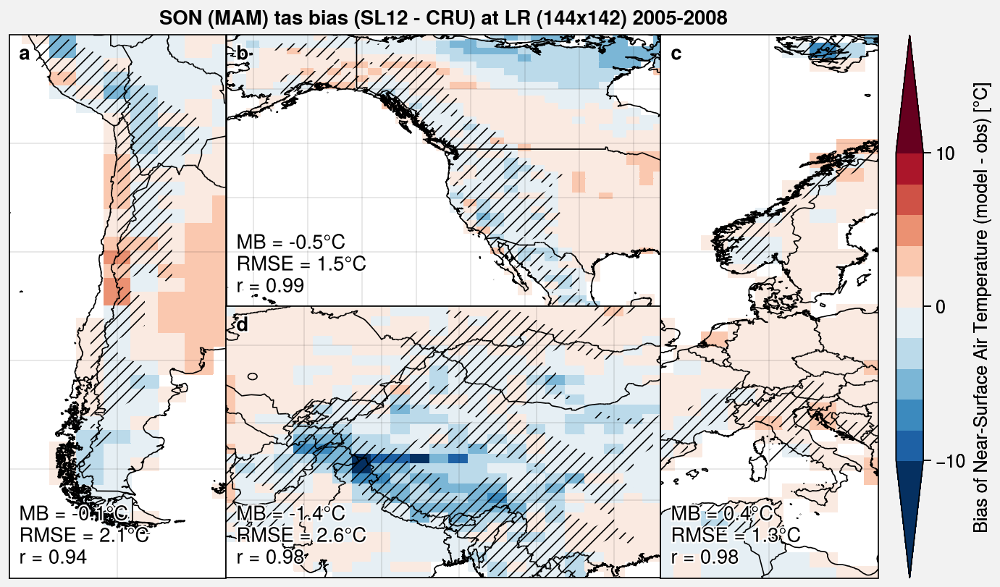

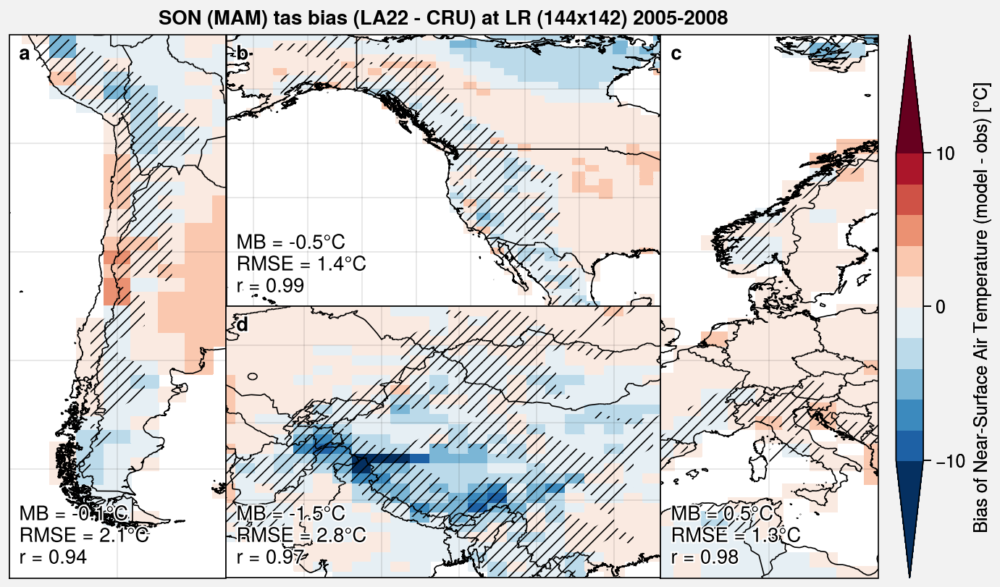

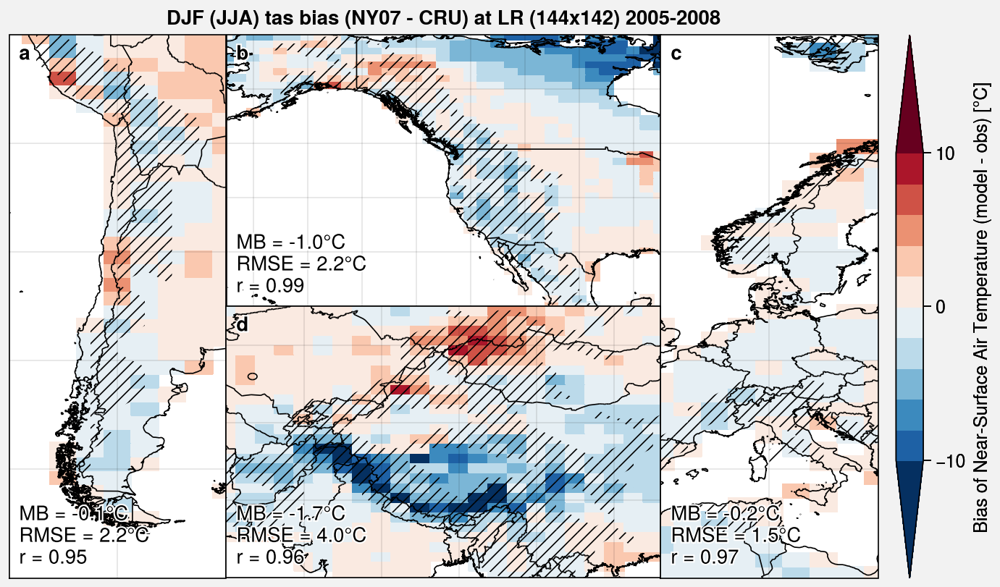

...

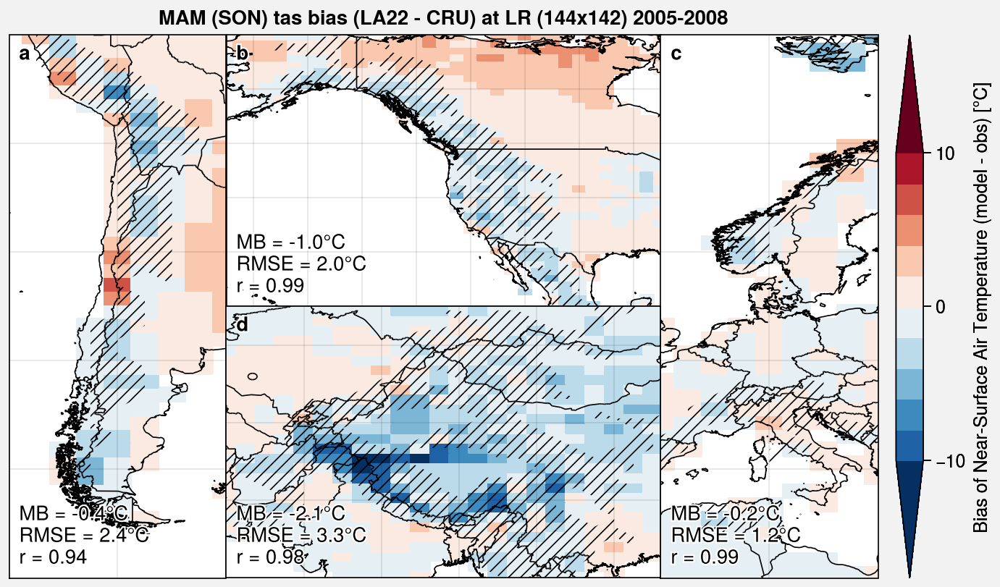

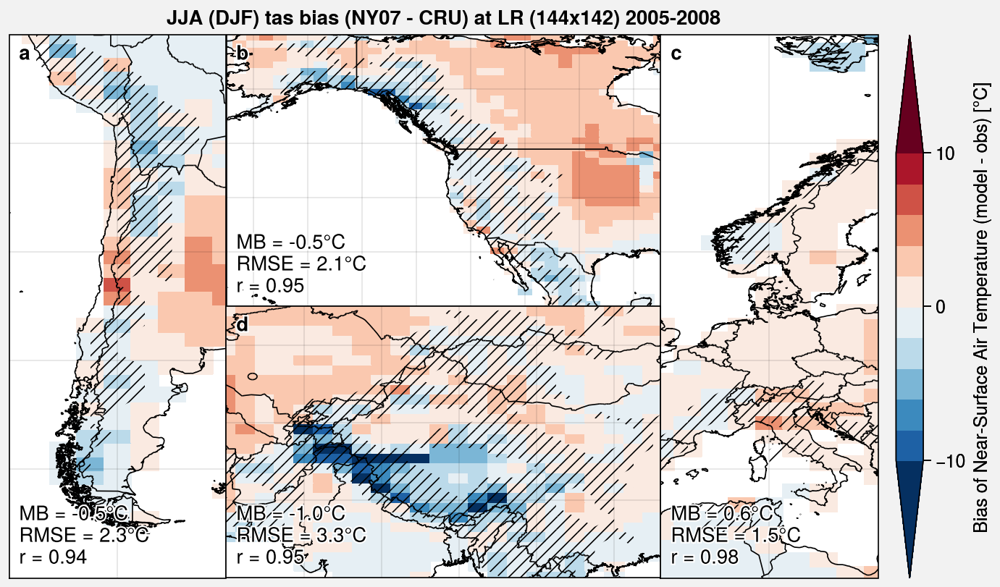

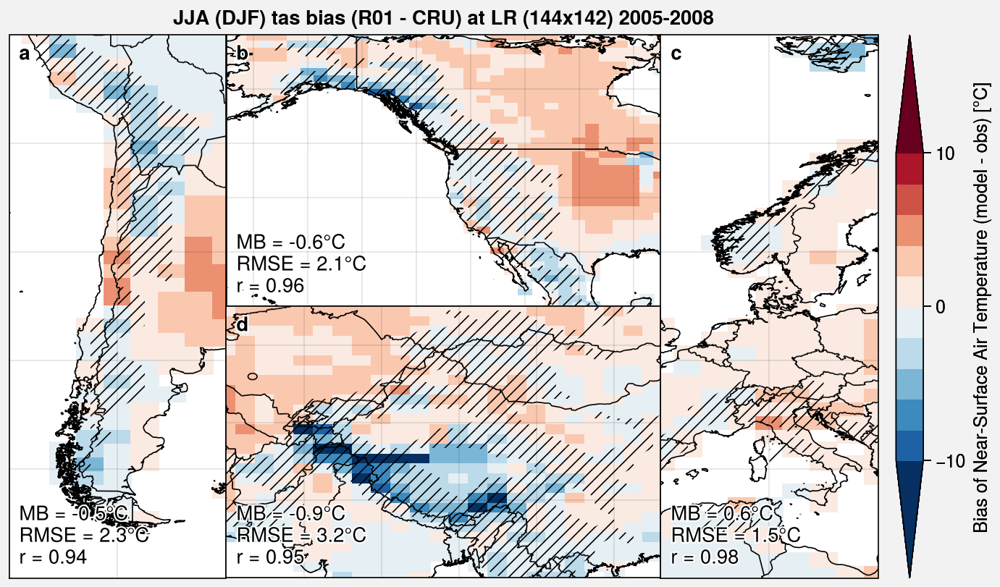

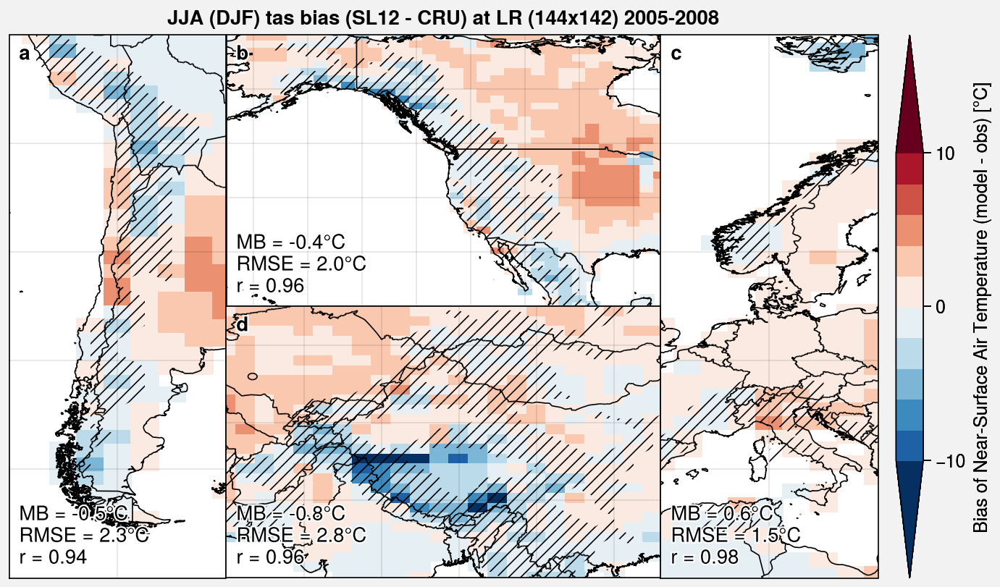

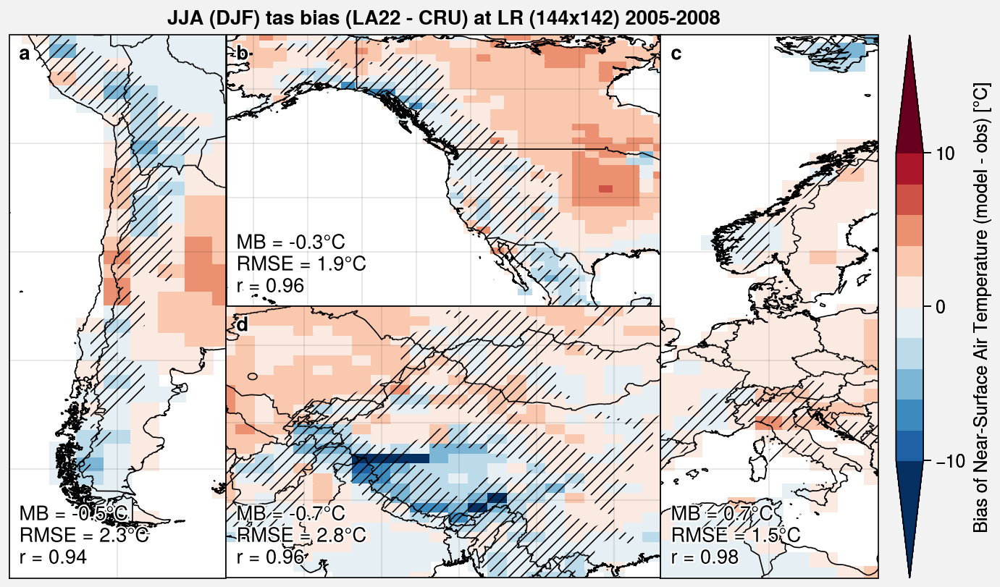

In [71]:
params = ['NY07', 'R01', 'SL12', 'LA22']

seasons = ['SON', 'DJF', 'MAM', 'JJA']
seasons_SA = ['MAM', 'JJA', 'SON', 'DJF']

cmap = 'RdBu_r'
levels = plot.arange(-10, 10, 2)
extend = 'both'

threshold = 200 # STD

for i_season, season in enumerate(seasons):
    for param in params:

        fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

        obs = tas_CRU_regrid_seas.sel(season=season)
        model = ds_tas_params[param].sel(season=season)
        
        obs_SA = tas_CRU_regrid_seas.sel(season=seasons_SA[i_season])
        model_SA = ds_tas_params[param].sel(season=seasons_SA[i_season])

        for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
            if i == 0: # take oposite season for SH
                obs_subset = obs_SA.sel(lat=latlim, lon=lonlim)
                model_subset = model_SA.sel(lat=latlim, lon=lonlim)
            else:
                obs_subset = obs.sel(lat=latlim, lon=lonlim)
                model_subset = model.sel(lat=latlim, lon=lonlim)

            m = axs[i].pcolormesh(model_subset - obs_subset, cmap=cmap, levels=levels, extend=extend)
            mb, rmse, (r, _) = compute_metrics(model_subset.where(std_LR_regrid > threshold), obs_subset.where(std_LR_regrid > threshold))
            axs[i].format(
                latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
                lltitle='MB = {:.1f}°C'.format(mb)+'\nRMSE = {:.1f}°C'.format(rmse)+'\nr = {:.2}'.format(r)
            )


        fig.colorbar(m, label='Bias of Near-Surface Air Temperature (model - obs) [°C]', ticks=10)

        for ax in axs:
            ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

        axs.format(
            lonlines=10, latlines=10,
            suptitle=season+' ('+seasons_SA[i_season]+') tas bias ('+param+' - CRU) at LR (144x142) '+str(period.start)+'-'+str(period.stop),
            coast=True, borders=True,
        #     ocean=True, oceancolor='pale blue',
            abc=True, abcloc='ul', reso='hi'
        )

        # fig.save('img/snowCCI_CRU_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')